루브릭

아래의 기준을 바탕으로 프로젝트를 평가합니다.

-----
평가문항	상세기준

1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.

오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.

2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.

gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.

3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.

모델구조 변경 혹은 학습과정 개선 아이디어를 추가적으로 적용해보았고, 적용 전과 비교하였을 때의 내용을 표와 같은 시각적 자료로 작성하였다.

# 목차



In [ ]:
# 버전 확인

import tensorflow
import imageio

print(tensorflow.__version__)
print(imageio.__version__)

2.9.2
2.9.0


In [ ]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

# 데이터셋 구성

In [ ]:
cifar10 = tf.keras.datasets.cifar10

(train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

In [ ]:
# 정규화

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


In [ ]:
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())


max pixel: 1.0
min pixel: -1.0


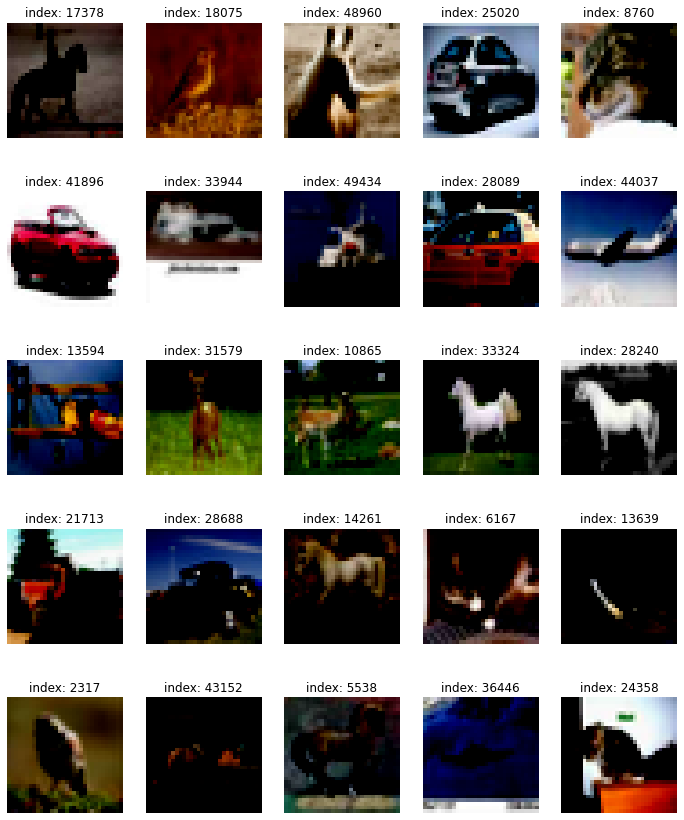

In [ ]:
# 데이터 시각화

plt.figure(figsize=(12, 15))

for i in range(25):
    plt.subplot(5, 5, i+1)
    random_index = np.random.randint(1, 50000)
    plt.imshow(train_x[random_index].reshape(32, 32, 3))
    plt.title(f'index: {random_index}')
    plt.axis('off')
plt.show()

In [ ]:
# 미니배치 데이터셋

BUFFER_SIZE = 50000
BATCH_SIZE = 256

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# 생성자 모델 구현하기

In [ ]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

(8, 8, 256) → (16, 16, 64) → (32, 32, 3) 의 순서로 이미지를 키워나간다.

In [ ]:
generator = make_generator_model()

generator.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 16384)             1638400   
                                                                 
 batch_normalization_9 (Batc  (None, 16384)            65536     
 hNormalization)                                                 
                                                                 
 leaky_re_lu_13 (LeakyReLU)  (None, 16384)             0         
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 8, 8, 128)        819200    
 ranspose)                                                       
                                                                 
 batch_normalization_10 (Bat  (None, 8, 8, 128)       

In [ ]:
# 테스트용 노이즈 생성
# 가우시안 분포에서 랜덤으로 뽑는다.
noise = tf.random.normal([1, 100])
noise

<tf.Tensor: shape=(1, 100), dtype=float32, numpy=
array([[ 1.2344843 , -1.260153  ,  1.2698232 , -1.4710863 ,  0.8873731 ,
        -1.404001  , -1.8961443 , -0.34269604,  0.22001688,  1.7918141 ,
         0.20509611, -0.4096755 , -2.3998067 ,  0.4046821 ,  0.9154958 ,
         1.8767482 ,  0.86196053, -0.60688925,  0.7865565 ,  0.74797714,
        -0.7207587 , -0.60268337, -1.661324  , -0.7804852 , -0.28855988,
         0.6996951 , -0.6170389 , -0.27110985, -0.7479157 ,  1.0759686 ,
         1.65192   ,  1.2113286 ,  0.03346599, -0.0389273 ,  1.3058238 ,
         0.6722489 , -1.0783678 , -1.0912645 , -0.1324537 ,  0.25899258,
         1.7182769 , -0.86167616,  1.9305733 , -0.28628197,  0.8681635 ,
         0.22795457,  1.1672727 ,  0.7158984 ,  1.1330205 , -0.4521535 ,
         1.0976039 , -0.54378855, -1.9332985 , -0.8600476 , -0.6202515 ,
         0.790101  , -0.00519032,  1.7053877 , -1.8780942 , -0.12745924,
        -1.1193477 ,  0.79144824, -0.38489822, -0.30060938, -1.0434531 ,
 

In [ ]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

우리에게 필요한 [32, 32, 3] 의 규격에 맞는 출력이 나온 것을 확인할 수 있다.

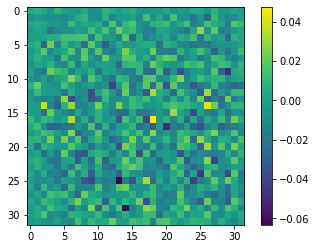

In [ ]:
plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

# 현재는 노이즈만이 출력된다.
# 4번째 인덱스는 0,1,2 세 개의 채널이 존재한다. 각각 다른 결과를 보여준다.

# 판별자 모델 구현하기

In [ ]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

In [ ]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_16 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
 dropout_4 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_17 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 dropout_5 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_2 (Flatten)         (None, 8192)             

In [ ]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00165732]], dtype=float32)>

단 하나의 값이 출력되는 모습을 확인할 수 있다.

# 손실함수와 최적화함수의 구현

## 손실함수

In [ ]:
# 손실함수로 교차 엔트로피를 사용한다.
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# 생성자의 손실함수
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
# 판별자의 손실함수
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [ ]:
# 판별 정확도를 계산하는 함수
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 최적화함수

In [ ]:
# 생성자와 판별자의 최적화 함수는 각각 만들어야한다.
# 최적화함수의 하이퍼 파라미터 1e-4 (변경가능)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
# 학습 진행을 확인하기 위한 샘플 시드

noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

# 훈련과정 상세 기능 구현하기

In [ ]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

train_step 함수를 하나하나 뜯어보면 다음과 같다.

-------

(1) 입력 데이터: Real Image 역할을 할 images 한 세트를 입력으로 받음

(2) 생성자 입력 노이즈 : generator가 FAKE IMAGE를 생성하기 위한 noise를 images 한 세트와 같은 크기인 BATCH_SIZE 만큼 생성함

(3) tf.GradientTape()는 가중치 갱신을 위한 Gradient를 자동 미분으로 계산하기 위해 with 구문 열기

(4) generated_images 생성 : generator가 noise를 입력받은 후 generated_images 생성

(5) discriminator 판별 : discriminator가 Real Image인 images와 Fake Image인 generated_images를 각각 입력받은 후 real_output, fake_output 출력

(6) loss 계산 : fake_output, real_output으로 generator와 discriminator 각각의 loss 계산

(7) accuracy 계산 : fake_output, real_output으로 discriminator의 정확도 계산

(8) gradient 계산 : gen_tape와 disc_tape를 활용해 gradient를 자동으로 계산

(9) 모델 학습 : 계산된 gradient를 optimizer에 입력해 가중치 갱신

(10) 리턴값 : 이번 스텝에 계산된 loss와 accuracy를 리턴

이러한 일련의 과정을 통해 한 번의 train_step이 끝나게 된다.


In [ ]:
# 고정된 시드로 학습 상태를 확인하는 함수
# 학습이 진행됨에 따라 달라진 결과물을 낸다.

def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i, :, :, :]+1)/2)
        plt.axis('off')
   
    plt.savefig('/content/drive/MyDrive/아이펠 데이터/dcgan_newimg/cifar_10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(1028, epoch, it))

    plt.show()

In [ ]:
# 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy history를 그래프로 시각화한다.

from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('/content/drive/MyDrive/아이펠 데이터/dcgan_newimg/cifar_10/training_history/train_history_{:04d}.png'
                    .format(1028, epoch))
    plt.show()

In [ ]:
# 중간 체크포인트 설정

checkpoint_dir = '/content/drive/MyDrive/아이펠 데이터/dcgan_newimg/cifar_10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# 학습 과정 진행하기

In [ ]:
# 학습을 하고 샘플을 저장하는 함수

def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [ ]:
save_every = 5
EPOCHS = 200

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

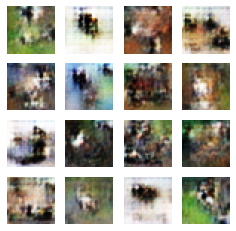

Time for training : 3173 sec


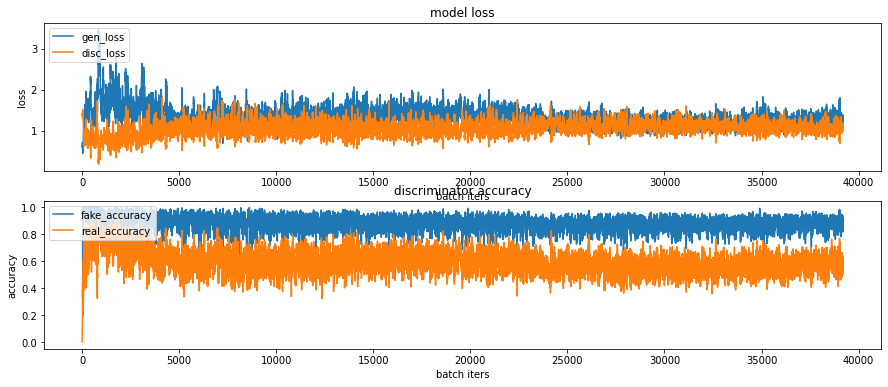

CPU times: user 21min 41s, sys: 1min 22s, total: 23min 3s
Wall time: 52min 55s


In [ ]:
%%time
train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/dcgan_newimage/fashion/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인할 수 있다.

# 학습과정 시각화

In [ ]:
# 그러나 Colab 환경에서는 잘 작동하지 않는 듯하다.
anim_file = '/content/drive/MyDrive/아이펠 데이터/dcgan_newimg/cifar_10/fashion_mnist_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('/aiffel/dcgan_newimage/cifar_10/generated_samples/sample*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l '/content/drive/MyDrive/아이펠 데이터/dcgan_newimg/cifar_10/fashion_mnist_dcgan.gif'

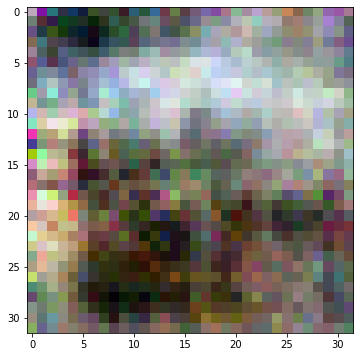

In [ ]:
# 체크포인트를 활용하는 함수
# 학습에 필요한 시간이 길기 때문에 체크포인트를 활용하면 모델의 수정이 용이하다.

checkpoint_dir = '/content/drive/MyDrive/아이펠 데이터/dcgan_newimg/cifar_10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

In [ ]:
# 체크포인트에서 모델을 시작하는 함수
%%time
train(train_dataset, EPOCHS, save_every)

# 회고

이번 노드에서는 DCGAN 모델을 통해 이미지를 직접 생성해보았다. 여기에서 중요한 것은 이미지를 생성하는 생성자와, 그것이 만들어진 가짜 이미지인지 아니면 데이터셋에 들어있던 진짜 이미지인지 판별하는 판별자를 동시에 학습시킨다는 점이었다. 따라서 생성자는 더 진짜 같은 이미지를 만들려 하고 판별자는 그것을 더 잘 구분하려 하며 서로 능력이 강화된다.

이미지와 관련된 2개의 모델을 동시에 다루다보니 이전의 다른 노드들보다도 학습하는데 소요되는 시간이 길었다. 또한 epoch을 마구 늘리게 되면 과적합이 발생할 수 있으므로 epoch=200 정도의 값이 적절하다고 판단했다. 이렇게 해도 이것을 끝마치기까지 약 50분의 시간이 걸렸다. 학습환경의 컴퓨팅 파워가 일반적인 컴퓨터들보다 좋은 환경임에도 불구하고 훨씬 더 많은 시간이 소요되었다.

GAN에 대한 글들을 찾아보던 중 옵티마이저에 대한 이야기가 있었다. 생성자는 ADAM으로, 판별자는 SGD로 하라는 내용이었고 나는 처음에 이것을 바로 적용해보았지만 제대로 된 결과물이 나오지 않았다. 판별자가 진짜와 가짜를 잘 구분하지 못 하고 있는 것이었다. 그래서 서로 0.5 정도의 정확도가 나오는 것이 이상적이었는데 fake accuracy는 1에 가까운 값이, real accuracy는 0에 가까운 값이 나왔다. 판별자가 거의 받아오는 거의 모든 이미지를 가짜로 판별하고 있다는 뜻이었고 판별자의 상태가 좋지 않으니 생성자도 제 역할을 하고 있지 못 했다. 그래서 판별자의 옵티마이저를 SGD에서 다시 ADAM으로 수정하여 학습을 다시 진행했다. 

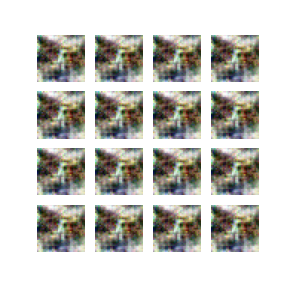

> (위 사진은 바로 그 잘 작동하지 않은 모델의 결과물이다. 추가로 중간에 문제가 더 있어서 16개 샘플의 결과가 모두 같기까지하다.)

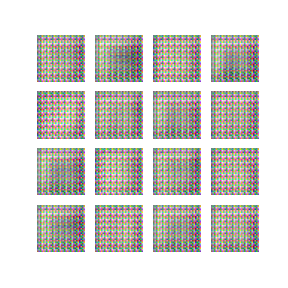

> 맨 처음 모델이 출력한 샘플이다. 아직은 이런 모양이지만...



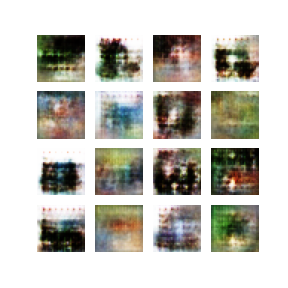

> 100개의 epoch을 지나니 점점 각자 구분되는 특징과 형태가 생겨나고 있다.

* 최종 결과물

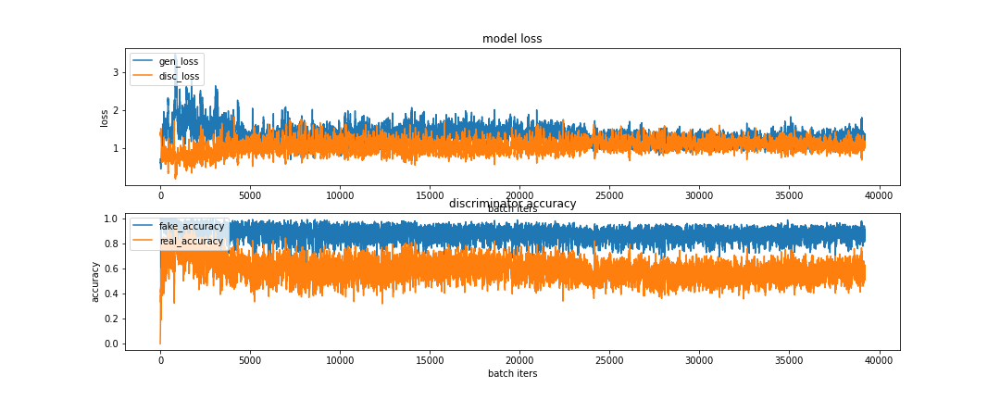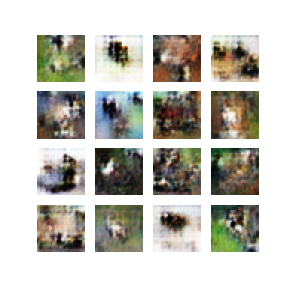

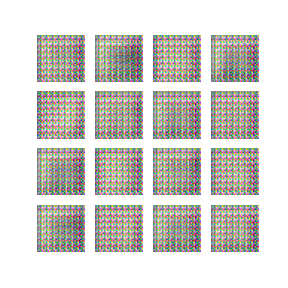

정확도를 보면 여전히 fake_accuracy가 더 높긴하지만 그래도 real_accuracy가 적당한 수준에 머무는 것을 확인할 수 있다.

결과물로 나온 이미지도 32*32 동물이나 사람 혹은 어떤 물체를 연상케하는 수준까지 발전했다. 만약 epoch을 더 높인다면 좀 더 나은 결과물이 나올 것으로 예상되지만 여러 제약에 의해 그러지 못 해 아쉬울 따름이다.

# Reference

https://towardsdatascience.com/what-is-transposed-convolutional-layer-40e5e6e31c11   
transposed-convolutional-layer

https://github.com/soumith/ganhacks  
GAN의 효율을 높이는 팁들

https://towardsdatascience.com/10-lessons-i-learned-training-generative-adversarial-networks-gans-for-a-year-c9071159628  
GAN을 사용하기 전 알아야할 10가지